In [1]:
import pandas as pd
import clip
import torch.nn as nn
from os.path import expanduser  # pylint: disable=import-outside-toplevel
from urllib.request import urlretrieve  # pylint: disable=import-outside-toplevel
from xformers.ops import MemoryEfficientAttentionFlashAttentionOp
import concurrent
import os
import numpy as np
import diffusers
import torch
from diffusers import StableDiffusionPipeline
# from diffusers.pipelines.stable_diffusion import StableDiffusionSafetyChecker
from PIL import Image

/root/autodl-tmp/hanze/.conda/envs/diffusion/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def get_aesthetic_model(clip_model="vit_l_14"):
    """load the aethetic model"""
    home = expanduser("~")
    cache_folder = home + "/.cache/emb_reader"
    path_to_model = cache_folder + "/sa_0_4_"+clip_model+"_linear.pth"
    if not os.path.exists(path_to_model):
        os.makedirs(cache_folder, exist_ok=True)
        url_model = (
            "https://github.com/LAION-AI/aesthetic-predictor/blob/main/sa_0_4_"+clip_model+"_linear.pth?raw=true"
        )
        urlretrieve(url_model, path_to_model)
    if clip_model == "vit_l_14":
        m = nn.Linear(768, 1)
    elif clip_model == "vit_b_32":
        m = nn.Linear(512, 1)
    else:
        raise ValueError()
    s = torch.load(path_to_model)
    m.load_state_dict(s)
    m.eval()
    return m

amodel= get_aesthetic_model(clip_model="vit_l_14")
device = "cuda" if torch.cuda.is_available() else "cpu"
amodel.to(device)
amodel.eval()

import torch

import open_clip
model, _, preprocess = open_clip.create_model_and_transforms('ViT-L-14', pretrained='openai')
model, preprocess = clip.load('ViT-L/14', device=device)

In [3]:
prompts = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"] # CIFAR labels
prompts = pd.DataFrame({'prompts': prompts})

In [4]:
def scores(image):
    images = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features= model.encode_image(images).to(device)
        image_features /= image_features.norm(dim=-1, keepdim=True)
        image_features=image_features.to(torch.float32)
        prediction = amodel(image_features)
        return(float(prediction))
    



def preprocess_image(image_list,index,epoch=0):
    score_list=[]
    for image in image_list:
        score_list.append(scores(image))
    torch.cuda.empty_cache()
    prompts.loc[index,f'custom sd scores {epoch}']=max(score_list)
    return [max(score_list),score_list.index(max(score_list))]

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


In [5]:
class StableDiffusionScoreCheckDataset():
    def __init__(self):
        global prompts
        self.prompts=prompts.iloc[:,0]
        
    def __len__(self):
        return len(self.prompts)
    
    def __getitem__(self,index):
        return self.prompts.iloc[index]

In [6]:
from torch.utils.data import DataLoader
dataset = StableDiffusionScoreCheckDataset()
batch_size=10
score_check_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)


In [7]:
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16).to(device)
pipe.enable_xformers_memory_efficient_attention()
image=pipe( ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"] ,num_images_per_prompt=10,width=256,height=256).images


grid = image_grid(image, 10,10)

grid.save("./pretrained.png")

Fetching 15 files: 100%|██████████| 15/15 [00:00<00:00, 60787.01it/s]
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
/root/autodl-tmp/hanze/.conda/envs/diffusion/lib/python3.9/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
100%|██████████| 50/50 [00:22<00:00,  2.27it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


In [8]:
for i in range(len(image)):
    image[i].save(f"./sample_pre/{i}.png")

In [ ]:
os.environ['MODEL_NAME'] = "runwayml/stable-diffusion-v1-5"

epochs=10
num_images_per_prompt=10
topk=5
import shutil

# remove old account directory
try: 
    shutil.rmtree('./CustomModel')
except:
    pass
try: 
    shutil.rmtree('./trainingdataset/imagefolder/')
except:
    pass

model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.enable_xformers_memory_efficient_attention()
for epoch in range(epochs):
    epoch=epoch
    training_steps=str(100*(epoch+1))
    
    if epoch>=1:
        pipe.unet.load_attn_procs(f'./CustomModel/')
    pipe = pipe.to(device)
    pipe.enable_xformers_memory_efficient_attention()
    prompts[f'custom sd scores {epoch}']=np.nan
    training_prompts=[]

    for step, prompt_list in enumerate(score_check_dataloader):
        image=pipe(prompt_list,num_images_per_prompt=num_images_per_prompt,width=256,height=256).images
        image_list=[]

        for i in range(int(len(image)/num_images_per_prompt)):
            image_list.append(image[i*num_images_per_prompt:(i+1)*num_images_per_prompt])
        torch.cuda.empty_cache()
        
        with concurrent.futures.ThreadPoolExecutor(max_workers=batch_size*2) as executor:
            step_list=[i for i in range(step*batch_size,(step+1)*batch_size)]
            score_index=executor.map(preprocess_image,image_list,step_list,[epoch for i in range(len(step_list))])

        iterator=0
        for max_scores in score_index:
            training_prompts.append([max_scores[0],image_list[iterator][max_scores[1]],prompt_list[iterator]])
            iterator+=1

    training_prompts=[row[1:3] for row in sorted(training_prompts,key=lambda x: (x[0]),reverse=True)[:topk]]
    training_prompts=pd.DataFrame(training_prompts)

    if not os.path.exists(f"./trainingdataset/imagefolder/{epoch}/train/"):
        os.makedirs(f"./trainingdataset/imagefolder/{epoch}/train/")
    if not os.path.exists(f"./CustomModel/"):
        os.makedirs(f"./CustomModel/")
    for i in range(len(training_prompts)):
        training_prompts.iloc[i,0].save(f'./trainingdataset/imagefolder/{epoch}/train/{i}.png')
    training_prompts['file_name']=[f"{i}.png" for i in range(len(training_prompts))]
    training_prompts.columns = ['0','text','file_name']
    training_prompts.drop('0',axis=1,inplace=True)
    training_prompts.to_csv(f'./trainingdataset/imagefolder/{epoch}/train/metadata.csv',index=False)

    torch.cuda.empty_cache()
    os.environ['TRAINING_DIR'] = f'./trainingdataset/imagefolder/{epoch}'
    os.environ['OUTPUT_DIR'] = f"./CustomModel/"
    os.environ['TRAINING_STEPS']=training_steps
    !accelerate launch --num_processes=1 --mixed_precision='bf16' --dynamo_backend='no' train_text_to_image_lora.py \
        --pretrained_model_name_or_path=$MODEL_NAME \
        --train_data_dir=$TRAINING_DIR \
        --resolution=256 \
        --train_batch_size=10 \
        --gradient_accumulation_steps=1 \
        --gradient_checkpointing \
        --max_grad_norm=1 \
        --max_train_steps=$TRAINING_STEPS \
        --learning_rate=6e-6 \
        --lr_scheduler="constant" \
        --lr_warmup_steps=0 \
        --enable_xformers_memory_efficient_attention \
        --output_dir=$OUTPUT_DIR \
        --lr_warmup_steps=0 \
        --checkpointing_steps=100 \
        --seed=123 \
        --resume_from_checkpoint="latest" 

    torch.cuda.empty_cache()


In [8]:
for i in range(epochs):
    if i==0:
        print('pretrained',prompts[f'custom sd scores {i}'].mean())
    else:
        print(f'epoch {i}:',prompts[f'custom sd scores {i}'].mean())

pretrained 5.2305539608001705
epoch 1: 5.6185389995574955
epoch 2: 5.743449735641479
epoch 3: 5.981496381759643
epoch 4: 5.846557521820069
epoch 5: 6.057356548309326
epoch 6: 5.983727836608887
epoch 7: 6.162206602096558
epoch 8: 6.115238523483276
epoch 9: 6.268258094787598


In [12]:
pipe.unet.load_attn_procs(f'./CustomModel/')
pipe = pipe.to(device)
pipe.enable_xformers_memory_efficient_attention()
image=pipe( ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"] ,num_images_per_prompt=10,width=256,height=256).images

grid = image_grid(image, 10,10)

grid.save("./trained.png")

100%|██████████| 50/50 [00:25<00:00,  1.98it/s]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


In [13]:
for i in range(len(image)):
    image[i].save(f"./sample_ft/{i}.png")

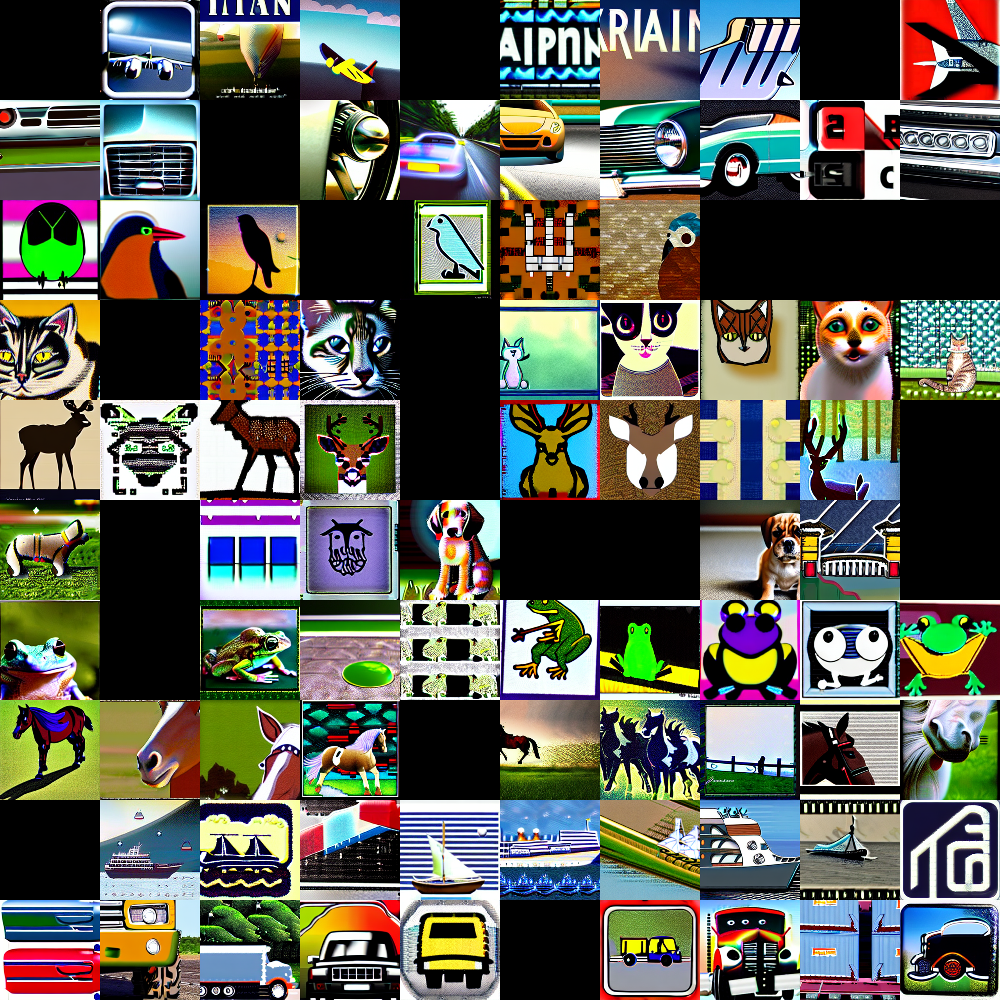